Deep Convolutional Generative Adversarial Networks (DCGANs) are a specialized type of GANs designed for high-quality image synthesis. DCGANs consist of two neural networks—a generator and a discriminator—that are trained adversarially. The generator aims to produce realistic images from random noise, while the discriminator works to distinguish between real images from the dataset and fake images generated by the generator. DCGANs leverage convolutional layers in both the generator and discriminator for capturing spatial hierarchies, resulting in better image generation quality compared to traditional GANs. The generator uses transposed convolutions to upscale random noise into images, while the discriminator uses regular convolutions to downsample images and classify them as real or fake. The adversarial training process encourages the generator to improve iteratively, leading to the synthesis of visually realistic images.



Size of the dataset: 40000


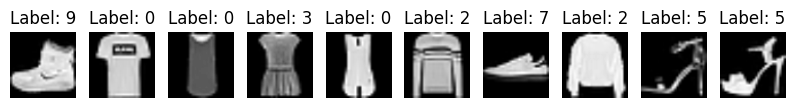

In [ ]:
import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
from torch.utils.data import Subset

# Set constants
BATCH_SIZE = 64
IMAGE_SIZE = 64  # Resize to 64x64 as DCGANs typically require larger input dimensions

# Data Preprocessing and Normalization
transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),              # Resize images to 64x64
    transforms.ToTensor(),                      # Convert images to PyTorch tensors
    transforms.Normalize(mean=(0.5,), std=(0.5,))  # Normalize to range [-1, 1]
])

# Load Fashion-MNIST Dataset
dataset = datasets.FashionMNIST(root='./data', train=True, transform=transform, download=True)
subset_size = 40000
indices = list(range(subset_size))  # Select the first 40,000 indices
subset = Subset(dataset, indices)
dataset_size = len(subset)
dataloader = DataLoader(subset, batch_size=BATCH_SIZE, shuffle=True)

print(f"Size of the dataset: {dataset_size}")
# Visualize samples from the dataset
def visualize_samples(dataset, num_samples=10):
    plt.figure(figsize=(10, 2))
    for i in range(num_samples):
        image, label = dataset[i]
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(image.squeeze(), cmap='gray')
        plt.title(f"Label: {label}")
        plt.axis('off')
    plt.show()

# Visualize samples
visualize_samples(dataset)


In [ ]:
import torch
import torch.nn as nn

# Constants
LATENT_DIM = 100  # Dimension of the latent vector
IMAGE_CHANNELS = 1  # Grayscale image
FEATURE_GEN = 64   # Feature maps for the generator
FEATURE_DISC = 64  # Feature maps for the discriminator

# Generator
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            # Input: (LATENT_DIM, 1, 1)
            nn.ConvTranspose2d(LATENT_DIM, FEATURE_GEN * 8, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(FEATURE_GEN * 8),
            nn.ReLU(True),

            # (FEATURE_GEN*8, 4, 4)
            nn.ConvTranspose2d(FEATURE_GEN * 8, FEATURE_GEN * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(FEATURE_GEN * 4),
            nn.ReLU(True),

            # (FEATURE_GEN*4, 8, 8)
            nn.ConvTranspose2d(FEATURE_GEN * 4, FEATURE_GEN * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(FEATURE_GEN * 2),
            nn.ReLU(True),

            # (FEATURE_GEN*2, 16, 16)
            nn.ConvTranspose2d(FEATURE_GEN * 2, FEATURE_GEN, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(FEATURE_GEN),
            nn.ReLU(True),

            # (FEATURE_GEN, 32, 32)
            nn.ConvTranspose2d(FEATURE_GEN, IMAGE_CHANNELS, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
            # Output: (IMAGE_CHANNELS, 64, 64)
        )

    def forward(self, x):
        return self.net(x)

# Discriminator
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            # Input: (IMAGE_CHANNELS, 64, 64)
            nn.Conv2d(IMAGE_CHANNELS, FEATURE_DISC, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            # (FEATURE_DISC, 32, 32)
            nn.Conv2d(FEATURE_DISC, FEATURE_DISC * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(FEATURE_DISC * 2),
            nn.LeakyReLU(0.2, inplace=True),

            # (FEATURE_DISC*2, 16, 16)
            nn.Conv2d(FEATURE_DISC * 2, FEATURE_DISC * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(FEATURE_DISC * 4),
            nn.LeakyReLU(0.2, inplace=True),

            # (FEATURE_DISC*4, 8, 8)
            nn.Conv2d(FEATURE_DISC * 4, FEATURE_DISC * 8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(FEATURE_DISC * 8),
            nn.LeakyReLU(0.2, inplace=True),

            # (FEATURE_DISC*8, 4, 4)
            nn.Conv2d(FEATURE_DISC * 8, 1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
            # Output: (1, 1, 1)
        )

    def forward(self, x):
        return self.net(x).view(-1)

# Initialize networks
generator = Generator()
discriminator = Discriminator()

# Print architectures
print(generator)
print(discriminator)


Generator(
  (net): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)
D

Design Rationale

Generator:

Upsampling:
 Transposed convolutions with strides are used to increase spatial dimensions progressively, ensuring high-resolution outputs.

Batch Normalization: Used to stabilize training by normalizing activations, reducing mode collapse.

Activation: ReLU ensures non-linearity and prevents vanishing gradients; tanh ensures output pixel values are in
[
−
1
,
1
]
[−1,1], matching the normalized input.

Discriminator:

Downsampling: Convolutions with strides are used to progressively reduce spatial dimensions, extracting features for classification.

LeakyReLU: Handles sparse gradients by allowing small gradients for negative inputs.


In [ ]:
import torch
import torch.optim as optim
import torchvision.utils as vutils
from torch.utils.tensorboard import SummaryWriter

# Constants
EPOCHS = 50
BATCH_SIZE = 128
LEARNING_RATE = 0.0002
BETA1 = 0.5  # Beta1 hyperparameter for Adam optimizers
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# Initialize generator and discriminator
generator.to(DEVICE)
discriminator.to(DEVICE)

# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

generator.apply(weights_init)
discriminator.apply(weights_init)

# Loss and optimizers
criterion = nn.BCELoss()
optimizer_g = optim.Adam(generator.parameters(), lr=LEARNING_RATE, betas=(BETA1, 0.999))
optimizer_d = optim.Adam(discriminator.parameters(), lr=LEARNING_RATE, betas=(BETA1, 0.999))

# Fixed noise for visualization
fixed_noise = torch.randn(64, LATENT_DIM, 1, 1, device=DEVICE)

# TensorBoard setup
writer = SummaryWriter(log_dir="runs/DCGAN_FashionMNIST")

# Training loop
for epoch in range(EPOCHS):
    for i, (real_images, _) in enumerate(dataloader):
        # Train Discriminator
        discriminator.zero_grad()

        # Real images
        real_images = real_images.to(DEVICE)
        batch_size = real_images.size(0)
        real_labels = torch.ones(batch_size, device=DEVICE)
        output_real = discriminator(real_images).squeeze()
        loss_real = criterion(output_real, real_labels)

        # Fake images
        noise = torch.randn(batch_size, LATENT_DIM, 1, 1, device=DEVICE)
        fake_images = generator(noise)
        fake_labels = torch.zeros(batch_size, device=DEVICE)
        output_fake = discriminator(fake_images.detach()).squeeze()
        loss_fake = criterion(output_fake, fake_labels)

        # Total discriminator loss
        loss_d = loss_real + loss_fake
        loss_d.backward()
        optimizer_d.step()

        # Train Generator
        generator.zero_grad()
        output = discriminator(fake_images).squeeze()
        loss_g = criterion(output, real_labels)
        loss_g.backward()
        optimizer_g.step()

        # Log losses to TensorBoard
        writer.add_scalar("Loss/Discriminator", loss_d.item(), epoch * len(dataloader) + i)
        writer.add_scalar("Loss/Generator", loss_g.item(), epoch * len(dataloader) + i)

    # Generate images for visualization
    with torch.no_grad():
        fake_images = generator(fixed_noise).detach().cpu()
    img_grid = vutils.make_grid(fake_images, normalize=True)
    writer.add_image("Generated Images", img_grid, epoch)

    print(f"Epoch [{epoch+1}/{EPOCHS}] Loss_D: {loss_d.item():.4f}, Loss_G: {loss_g.item():.4f}")

writer.close()



Epoch [1/50] Loss_D: 0.5357, Loss_G: 4.4584
Epoch [2/50] Loss_D: 2.2848, Loss_G: 1.3816
Epoch [3/50] Loss_D: 0.3671, Loss_G: 5.3581
Epoch [4/50] Loss_D: 0.3756, Loss_G: 2.7818
Epoch [5/50] Loss_D: 0.2650, Loss_G: 4.0435
Epoch [6/50] Loss_D: 0.2598, Loss_G: 3.5299
Epoch [7/50] Loss_D: 0.0762, Loss_G: 5.4931
Epoch [8/50] Loss_D: 0.1004, Loss_G: 3.2699
Epoch [9/50] Loss_D: 0.0889, Loss_G: 4.4962
Epoch [10/50] Loss_D: 1.0068, Loss_G: 2.5566
Epoch [11/50] Loss_D: 0.0345, Loss_G: 5.0168
Epoch [12/50] Loss_D: 0.0749, Loss_G: 4.2790
Epoch [13/50] Loss_D: 0.0909, Loss_G: 5.2566
Epoch [14/50] Loss_D: 0.2800, Loss_G: 3.6982
Epoch [15/50] Loss_D: 0.0347, Loss_G: 4.6194
Epoch [16/50] Loss_D: 0.0466, Loss_G: 4.5824
Epoch [17/50] Loss_D: 0.0155, Loss_G: 5.3025
Epoch [18/50] Loss_D: 0.0485, Loss_G: 5.6966
Epoch [19/50] Loss_D: 0.0642, Loss_G: 5.1292
Epoch [20/50] Loss_D: 0.0177, Loss_G: 5.4878
Epoch [21/50] Loss_D: 0.6119, Loss_G: 3.3478
Epoch [22/50] Loss_D: 0.0541, Loss_G: 4.6255
Epoch [23/50] Loss_

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=runs/DCGAN_FashionMNIST


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 9490), started 1:26:21 ago. (Use '!kill 9490' to kill it.)

<IPython.core.display.Javascript object>

The adversarial loss is based on the minimax game between
G and
D:
The discriminator aims to maximize its ability to
Correctly classify real samples as real (
D(x) close to 1).

Correctly classify fake samples from
G(z) as fake (
D(G(z)) close to 0).


Generator's Loss
The generator aims to minimize the discriminator's ability to distinguish fake data from real data.

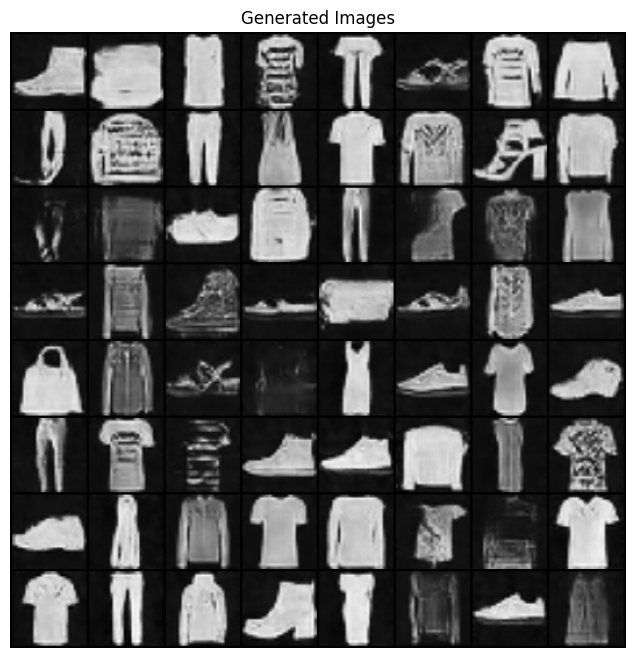

In [ ]:
import matplotlib.pyplot as plt
import torchvision.utils as vutils
import numpy as np

# Generate samples
noise = torch.randn(64, LATENT_DIM, 1, 1, device=DEVICE)
with torch.no_grad():
    generated_images = generator(noise).cpu()

# Visualize the generated samples
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Generated Images")
plt.imshow(np.transpose(vutils.make_grid(generated_images, normalize=True, padding=2).numpy(), (1, 2, 0)))
plt.show()


Challenges Encountered

Mode Collapse:

Generator produces limited variations of images.

Mitigation:
Experiment with different learning rates and optimizers.


GAN training can be unstable, leading to divergence or oscillating losses.

Mitigation:
Carefully initialize weights and use a balanced discriminator and generator architecture.

Slow Convergence:

Training GANs often requires substantial computational resources and time.

Mitigation:
Use a subset of the dataset if computational resources are limited.
Implement early stopping based on visual quality.

